In [1]:
%load_ext autoreload
%autoreload 2

In [5]:
import sys
sys.path.append("..")
sys.path.append("../..")

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [37]:
import os
from pathlib import Path
import pickle
import timeit
#
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms, models
from dotted_dict import DottedDict
from tqdm import tqdm
import pprint
#
from csprites.datasets import ClassificationDataset
from sklearn.linear_model import LogisticRegression
import utils
from backbone import get_backbone
from optimizer import get_optimizer
from plot_utils import *
from Distributions.functions import *

In [27]:
def load_data_tensors(target_idx, p_R_train, p_Y_train, p_R_valid, p_Y_valid):
    R_train = np.load(p_R_train)
    R_valid = np.load(p_R_valid)
    #
    Y_train = np.load(p_Y_train)
    Y_valid = np.load(p_Y_valid)
    #
    d_r = R_train.shape[1]
    #
    if target_idx is not None:
        Y_train = Y_train[:, target_idx]
        Y_valid = Y_valid[:, target_idx]
    #
    return R_train, Y_train, R_valid, Y_valid


# Settings

In [9]:
# linprob config
linprob_config = {
    'p_eval': 'eval',
    'p_eval_results': 'results_lr.pkl',
    'p_config': "linprob_config_lr.pkl",
    'p_results': 'results_lr.pkl',
}
linprob_config = DottedDict(linprob_config)

In [10]:
p_experiments_base = Path("/mnt/experiments/csprites/single_csprites_64x64_n7_c128_a32_p10_s3_bg_inf_random_function_100000")
p_experiments_base = p_experiments_base / "beta_architecture"
p_experiments = list(p_experiments_base.glob("Beta*"))
print("#Experiments: ", len(p_experiments))

#Experiments:  408


# RUN ALL

In [ ]:
step = 1
max_steps = len(p_experiments) * 2 * 6
print_str = "[{:>3}/{:>3}] {:>10} {:<10} {}"
for p_experiment in p_experiments:
    experiment_name = p_experiment.name
    
    # experiment config
    p_experiment_config = p_experiment / "config.pkl"
    with open(p_experiment_config, "rb") as file:
        experiment_config = pickle.load(file)
    # dataset config
    p_ds_config = Path(experiment_config.p_data) / "config.pkl"
    with open(p_ds_config, "rb") as file:
        ds_config = pickle.load(file)
    ds_reps = {
            "bacbone": {
                "R_train": experiment_config["p_R_train"],
                "R_valid": experiment_config["p_R_valid"],
                "Y_train": experiment_config["p_Y_train"],
                "Y_valid": experiment_config["p_Y_valid"],
                  },
           "betapro": {
               "R_train": experiment_config["p_R_train_bp"],
               "R_valid": experiment_config["p_R_valid_bp"],
               "Y_train": experiment_config["p_Y_train_bp"],
               "Y_valid": experiment_config["p_Y_valid_bp"],
                }
           }
    results = {ds_key: {} for ds_key in ds_reps.keys()}
    for ds_key in ds_reps.keys():
        for target_variable in ds_config["classes"]:
            print(print_str.format(step, max_steps, ds_key, target_variable, experiment_name))
            target_idx = [idx for idx, target in enumerate(ds_config["classes"]) if target == target_variable][0]
            n_classes = ds_config["n_classes"][target_variable]
            #
            R_train, Y_train, R_valid, Y_valid = load_data_tensors(
                target_idx,
                p_experiment /ds_reps[ds_key]["R_train"],
                p_experiment /ds_reps[ds_key]["Y_train"],
                p_experiment /ds_reps[ds_key]["R_valid"],
                p_experiment /ds_reps[ds_key]["Y_valid"])
            #
            clf = LogisticRegression(random_state=0).fit(R_train, Y_train)
            score = clf.score(R_valid, Y_valid)
            print("   LINPROB: {:.3f}".format(score))

            results[ds_key][target_variable] = score
            step += 1
    p_results = p_experiment / linprob_config["p_results"]
    p_linprob_config = p_experiment / linprob_config["p_config"]
    #
    with open(p_results, "wb") as file:
        pickle.dump(results, file)
    with open(p_linprob_config, "wb") as file:
        pickle.dump(linprob_config, file)

# LOAD ALL RESULTS

In [11]:
p_experiments = list(p_experiments_base.glob("Beta*"))
print("#Experiments: ", len(p_experiments))

#Experiments:  408


In [12]:
experiment_results = {}
for p_experiment in p_experiments:
    experiment_name = p_experiment.name
    print(experiment_name)
    #
    p_results = p_experiment / linprob_config["p_results"]
    #
    with open(p_results, "rb") as file:
        results = pickle.load(file)
    experiment_results[experiment_name] = results

Beta[w0_dID]_Barlow[w2_d512][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-01_00-09-57
Beta[w2_d64]_Barlow[w1_d128][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-01_21-51-16
Beta[w0_dID]_Barlow[w3_d512][dkl10_a0.9_b0.1]_[ResNet-18]_2021-09-01_00-34-23
Beta[w0_dID]_Barlow[w3_d256][dkl10_a0.1_b0.9]_[ResNet-18]_2021-08-31_23-08-57
Beta[w2_d512]_Barlow[w0_dID][dkl10_a0.1_b0.1]_[ResNet-18]_2021-09-02_04-58-55
Beta[w2_d128]_Barlow[w2_d256][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-02_02-59-08
Beta[w1_d64]_Barlow[w2_d256][dkl10_a0.9_b0.1]_[ResNet-18]_2021-09-01_07-02-53
Beta[w1_d512]_Barlow[w3_d1024][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_15-52-34
Beta[w2_d64]_Barlow[w1_d64][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_21-14-19
Beta[w1_d1024]_Barlow[w2_d4096][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_19-09-43
Beta[w1_d512]_Barlow[w2_d2048][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-01_15-15-26
Beta[w1_d64]_Barlow[w3_d128][dkl10_a0.9_b0.1]_[ResNet-18]_2021-09-01_07-51-23
Beta[w1_d64]_Barlow[w3_d64][dkl10_a0.5_b0.5]_[ResNet-18]_

Beta[w1_d512]_Barlow[w1_d2048][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_13-49-06
Beta[w1_d1024]_Barlow[w2_d2048][dkl10_a0.9_b0.1]_[ResNet-18]_2021-09-01_18-54-57
Beta[w1_d1024]_Barlow[w3_d4096][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-01_20-37-13
Beta[w2_d128]_Barlow[w2_d512][dkl10_a0.1_b0.1]_[ResNet-18]_2021-09-02_03-20-44
Beta[w2_d128]_Barlow[w0_dID][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-02_01-08-17
Beta[w1_d512]_Barlow[w0_dID][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_12-34-15
Beta[w2_d64]_Barlow[w3_d64][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_23-42-05
Beta[w1_d64]_Barlow[w1_d128][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-01_05-26-30
Beta[w1_d64]_Barlow[w3_d64][dkl10_a0.9_b0.1]_[ResNet-18]_2021-09-01_07-27-10
Beta[w2_d64]_Barlow[w2_d256][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_23-17-31
Beta[w1_d128]_Barlow[w1_d256][dkl10_a0.5_b0.5]_[ResNet-18]_2021-09-01_09-29-25
Beta[w1_d64]_Barlow[w2_d256][dkl10_a0.1_b0.1]_[ResNet-18]_2021-09-01_06-50-49
Beta[w1_d512]_Barlow[w2_d512][dkl10_a0.9_b0.1]_[ResNet-1

# FILTER RESULTS

In [13]:
split = "valid"
acc_min = 0.8
acc_idx = 1

In [14]:
acc_results = []
#
for experiment_name in experiment_results.keys():
    results = experiment_results[experiment_name]
    # features
    features = list(results.keys())
    # targets
    targets = list(results[features[0]].keys())
    
    feature_target_accs = []
    col_names = []
    for target_name in targets:
        for feature_name in features:
            acc = results[feature_name][target_name]
                
            feature_target_accs.append(acc)
            col_names.append("{}_{}".format(feature_name, target_name))
    acc_results.append(feature_target_accs)
acc_results = np.array(acc_results)
feature_names = col_names
#
idcs = acc_results[:,acc_idx] >= acc_min
acc_results = acc_results[idcs]
experiment_names = [n[4:-32] for n in experiment_results.keys()]
experiment_names = np.array(experiment_names)[idcs]

In [15]:
# sort
idcs_bb = acc_results[:,0].argsort()
idcs_bp = acc_results[:,1].argsort()
#
experiment_names_bb = experiment_names[idcs_bb]
acc_matrix_bb = acc_results[idcs_bb]
#
experiment_names_bp = experiment_names[idcs_bp]
acc_matrix_bp = acc_results[idcs_bp]

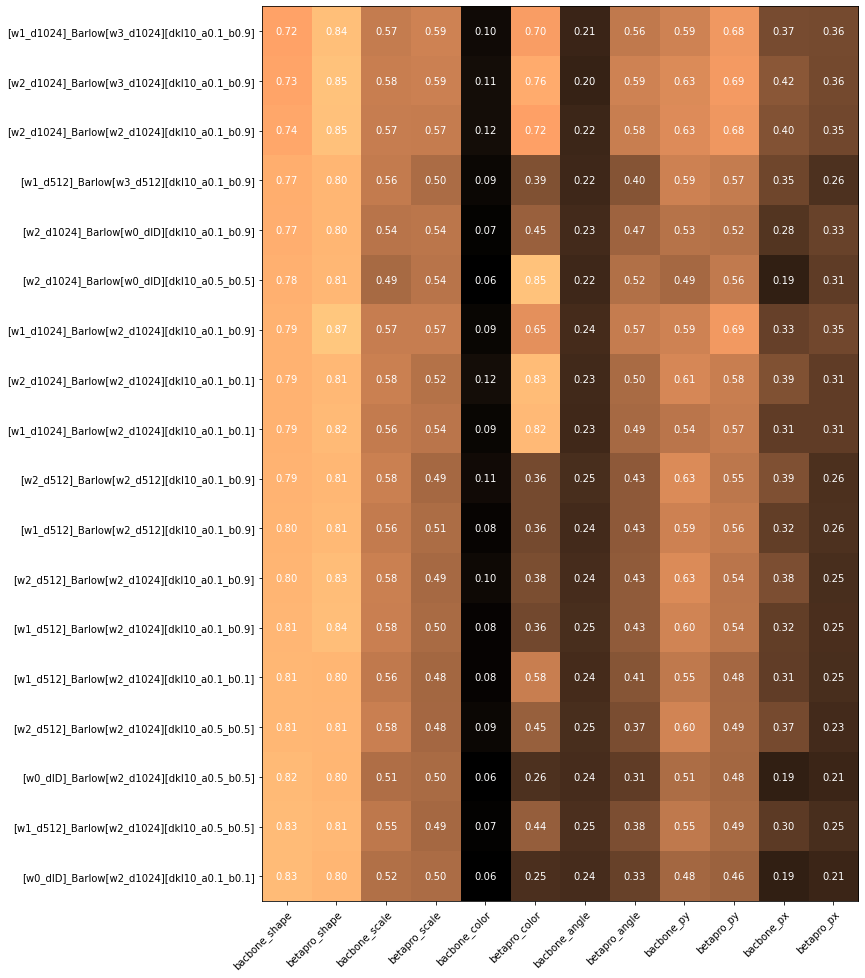

In [16]:
plot_mat(acc_matrix_bb, experiment_names_bb, feature_names, scale_factor=1)

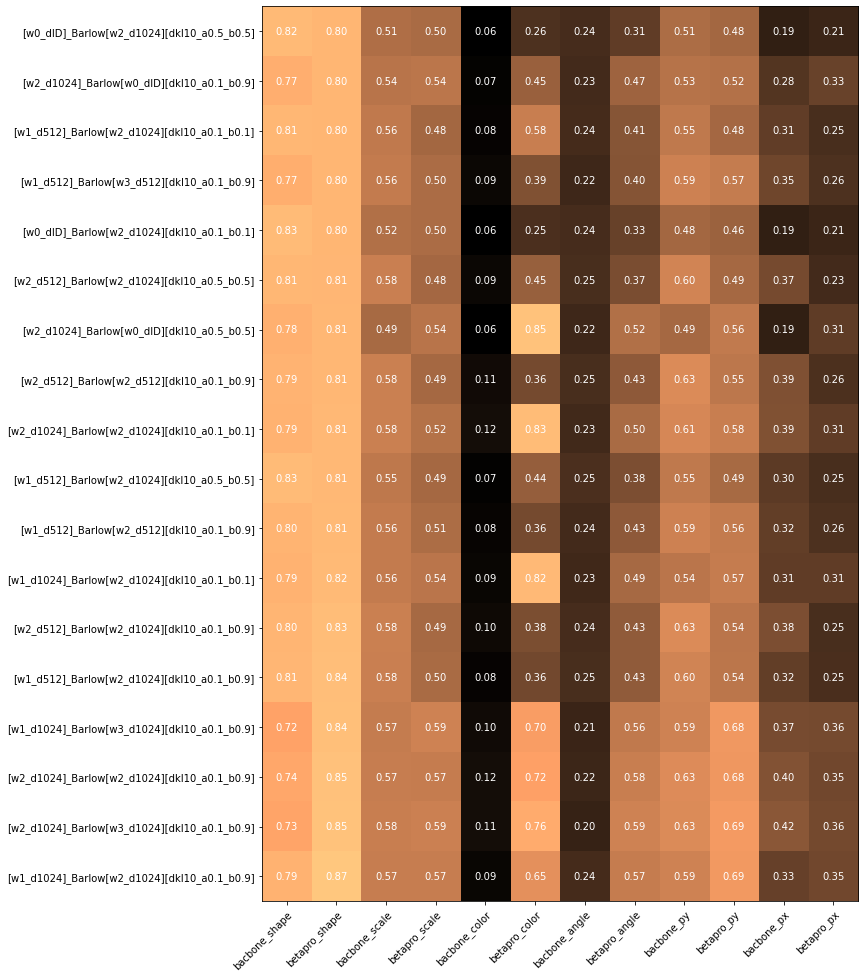

In [17]:
plot_mat(acc_matrix_bp, experiment_names_bp, feature_names, scale_factor=1)

In [18]:
print("HI")

HI


In [23]:
for p in p_experiments:
    if "[w1_d1024]_Barlow[w2_d1024][dkl10_a0.1_b0.9]" in p.name:
        print(p)

/mnt/experiments/csprites/single_csprites_64x64_n7_c128_a32_p10_s3_bg_inf_random_function_100000/beta_architecture/Beta[w1_d1024]_Barlow[w2_d1024][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_18-20-02


# Load Data Tensors

In [24]:
p_experiment = Path("/mnt/experiments/csprites/single_csprites_64x64_n7_c128_a32_p10_s3_bg_inf_random_function_100000/beta_architecture/Beta[w1_d1024]_Barlow[w2_d1024][dkl10_a0.1_b0.9]_[ResNet-18]_2021-09-01_18-20-02")

In [26]:
 # experiment config
p_experiment_config = p_experiment / "config.pkl"
with open(p_experiment_config, "rb") as file:
    experiment_config = pickle.load(file)
# dataset config
p_ds_config = Path(experiment_config.p_data) / "config.pkl"
with open(p_ds_config, "rb") as file:
    ds_config = pickle.load(file)
ds_reps = {
        "bacbone": {
                "R_train": experiment_config["p_R_train"],
                "R_valid": experiment_config["p_R_valid"],
                "Y_train": experiment_config["p_Y_train"],
                "Y_valid": experiment_config["p_Y_valid"],
                  },
           "betapro": {
               "R_train": experiment_config["p_R_train_bp"],
               "R_valid": experiment_config["p_R_valid_bp"],
               "Y_train": experiment_config["p_Y_train_bp"],
               "Y_valid": experiment_config["p_Y_valid_bp"],
                }
}

In [54]:
ds_key = "betapro"
R_train, Y_train, R_valid, Y_valid = load_data_tensors(
                None,
                p_experiment /ds_reps[ds_key]["R_train"],
                p_experiment /ds_reps[ds_key]["Y_train"],
                p_experiment /ds_reps[ds_key]["R_valid"],
                p_experiment /ds_reps[ds_key]["Y_valid"])

In [55]:
R = R_valid
Y = Y_valid
a_est, b_est = beta_params(R)
#
n_samples = 1000
idcs = np.random.choice(R.shape[0], size=n_samples, replace=False)
#
R = R[idcs]
Y = Y[idcs]
target_idx = 2
#
cmap = "turbo"

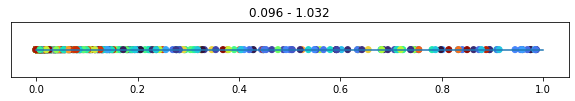

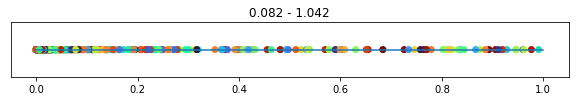

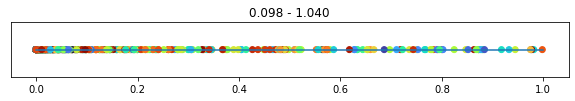

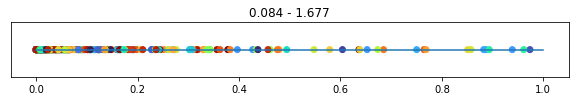

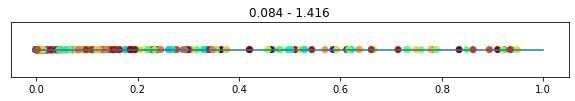

...

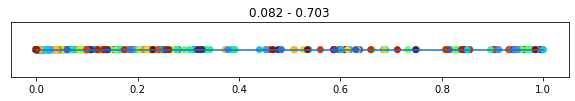

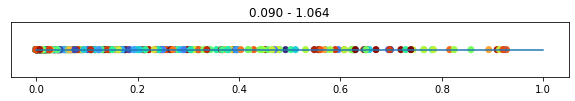

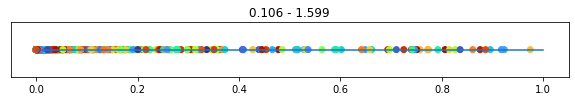

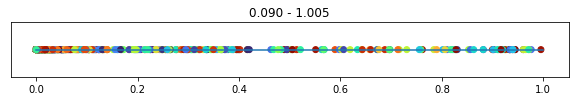

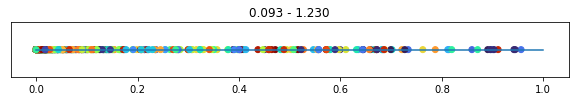

KeyboardInterrupt: 

In [56]:
for idx in range(R.shape[1]):
    title = "{:.3f} - {:.3f}".format(a_est[idx], b_est[idx])
    simplex_plot(R[:,idx], title=title, c=Y[:, target_idx], cmap=cmap)

In [59]:
R = R_valid

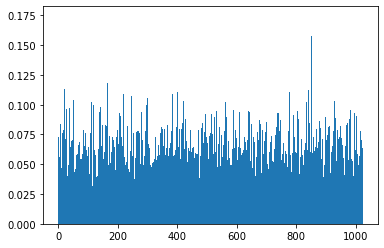

In [64]:
plt.bar(range(R.shape[1]), R.mean(axis=0), width=1)
plt.show()

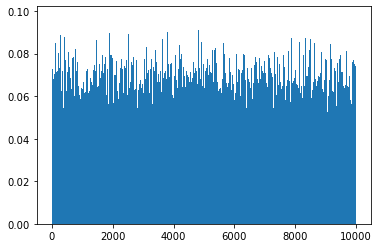

In [65]:
plt.bar(range(R.shape[0]), R.mean(axis=1), width=1)
plt.show()